# Overview
- 電車の走り出すタイミングを推定してみる
- ベイズモデリングを使用する

- model
    1. centroid ~ gamma
    1. flatness ~ gamma
    1. hierarchical bayes (centroid, flatness) ~ gamma (tau_sec を共通に持つ)

# Params

In [1]:
WAV_PATH = './22_pymc3_train/train.wav'
cp = ['#f8b195', '#f67280', '#c06c84', '#6c5b7b', '#355c7d']
SR_FEAT = 10

# Import everything I need :)

In [68]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pymc3 as pm
import IPython.display
from scipy import stats
from scipy import optimize

# My func

In [3]:
def get_kde(y, expand_rate=0.1):
    sign_min, sign_max = min(y) < 0, max(y) < 0
    sign_min = 1 if sign_min else -1
    sign_max = -1 if sign_max else 1
    x_kde = np.linspace(min(y)*(1 + expand_rate * sign_min),
                        max(y)*(1 + expand_rate * sign_max),
                        len(y))
    kde_model = stats.gaussian_kde(y)
    kde = kde_model(x_kde)
    return x_kde, kde

# Preparation

set

In [4]:
sns.set()
sns.set_context('talk')

<br>

load wav

In [5]:
wav, sr = librosa.load(WAV_PATH, sr=None)
print(f'sampling rate: {sr}')
print(f'recording time: {len(wav)/sr:.3f} sec')

sampling rate: 44100
recording time: 90.085 sec


<br>

variables

In [6]:
x_wav_sec = np.arange(0, len(wav))/sr

# Feature extraction

In [7]:
hop_length = int(sr/SR_FEAT)
n_fft = int(hop_length*2)

In [8]:
centroid = librosa.feature.spectral_centroid(y=wav, sr=sr, n_fft=n_fft, hop_length=hop_length)[0]
roll_off = librosa.feature.spectral_rolloff(y=wav, sr=sr, n_fft=n_fft, hop_length=hop_length)[0]
flatness = librosa.feature.spectral_flatness(y=wav, n_fft=n_fft, hop_length=hop_length)[0]
zcr = librosa.feature.zero_crossing_rate(y=wav, frame_length=n_fft, hop_length=hop_length)[0]

x_feat_sec = np.arange(len(zcr))/SR_FEAT + 1/SR_FEAT/2

In [9]:
df_feat = pd.DataFrame(np.array([centroid, roll_off, flatness, zcr]).T,
                       columns=['centroid', 'roll_off', 'flatness','zcr'])

# EDA

listen

In [10]:
IPython.display.display(IPython.display.Audio(wav, rate=sr))

<br>

time series

Text(0.5, 0, 'recording time [sec]')

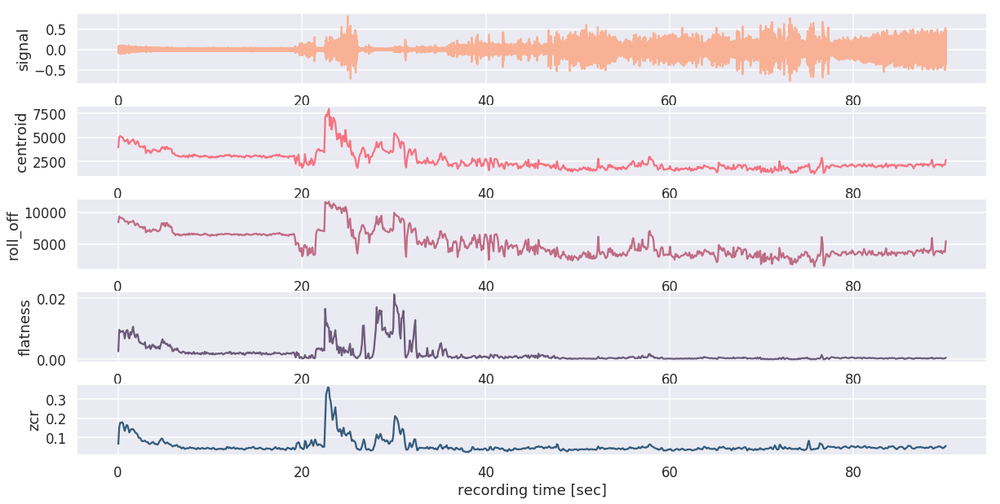

In [11]:
fig, axs = plt.subplots(5, 1, figsize=(20, 10))
plt.subplots_adjust(wspace=0.8, hspace=0.3)
axs = axs.ravel()

axs[0].plot(x_wav_sec, wav, c=cp[0])
axs[0].set_ylabel('signal')

for i, feat in enumerate(df_feat.columns):
    axs[i+1].plot(x_feat_sec, df_feat[feat].values, c=cp[i+1])
    axs[i+1].set_ylabel(feat)

axs[4].set_xlabel('recording time [sec]')

<br>
<br>

histgram

/usr/local/lib/python3.6/dist-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


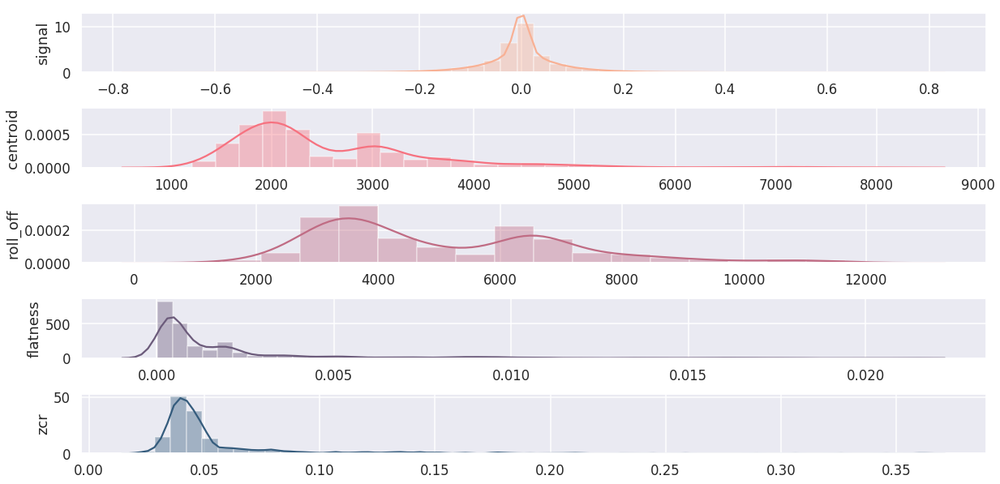

In [12]:
fig, axs = plt.subplots(5, 1, figsize=(20, 10))
plt.subplots_adjust(wspace=0.8, hspace=0.6)
axs = axs.ravel()

sns.distplot(wav, color=cp[0], ax=axs[0])
axs[0].set_ylabel('signal')

for i, feat in enumerate(df_feat.columns):
    sns.distplot(df_feat[feat].values, color=cp[i+1], ax=axs[i+1])
    axs[i+1].set_ylabel(feat)

<br>

今回知りたいのは、電車の発進タイミング。変化検知問題としてモデリングを行う。   
`停車状態---> 走行状態 `  
と変化する過程をモデリングで捉える。  
具体的にはある時間を境目に確率分布が急に変化するとする。

<br>

`centroid` で確認してみる。

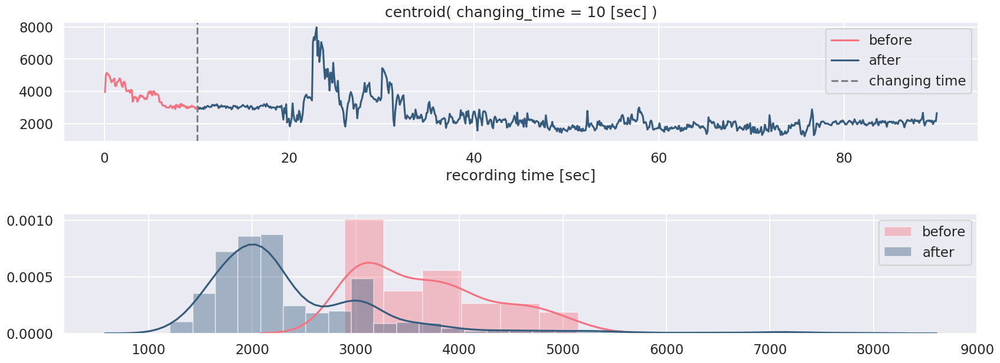

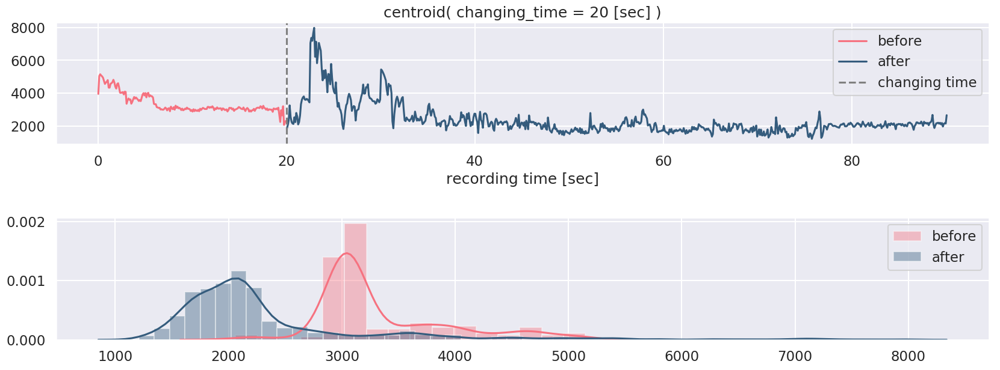

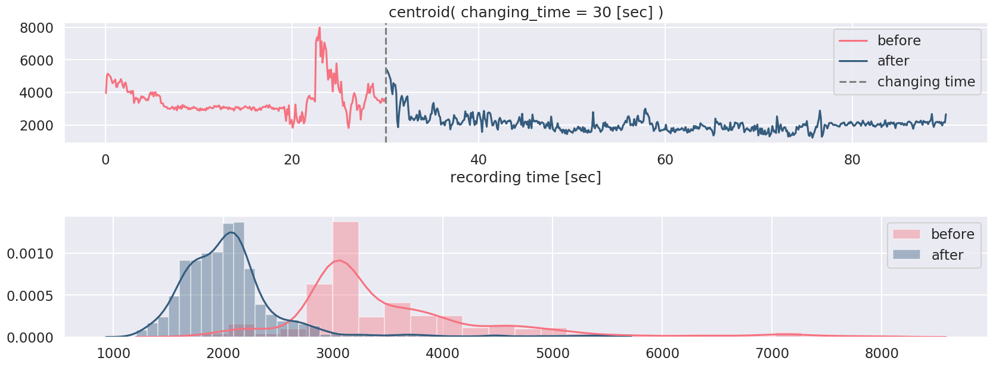

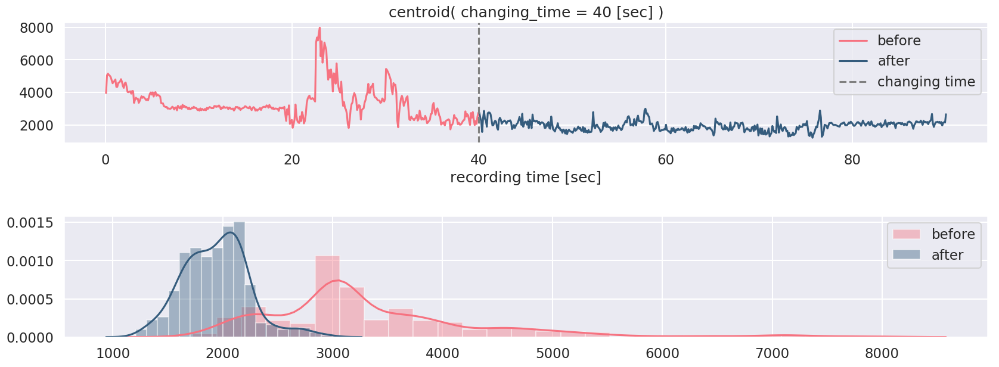

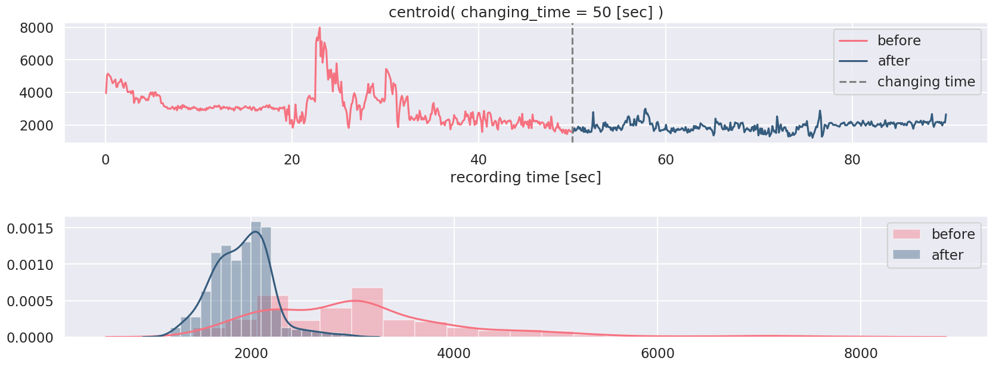

In [13]:
feat = centroid
# feat = zcr
for changing_time_sec in [10, 20, 30, 40, 50]:
    fig, axs = plt.subplots(2, 1, figsize=(20, 7), dpi=100)
    plt.subplots_adjust(wspace=0.8, hspace=0.6)
    axs = axs.ravel()

    changing_idx = changing_time_sec*SR_FEAT
    axs[0].plot(x_feat_sec[:changing_idx], feat[:changing_idx], color=cp[1], label='before')
    axs[0].plot(x_feat_sec[changing_idx:], feat[changing_idx:], color=cp[4], label='after')
    axs[0].axvline(changing_time_sec, color='gray', linestyle='--', label='changing time')
    axs[0].set_title(f'centroid( changing_time = {changing_time_sec} [sec] )')
    axs[0].set_xlabel('recording time [sec]')
    axs[0].legend()
    sns.distplot(feat[:changing_idx], ax=axs[1], color=cp[1], label='before')
    sns.distplot(feat[changing_idx:], ax=axs[1], color=cp[4], label='after')
    axs[1].legend()

<br>

`flatness` で確認してみる。

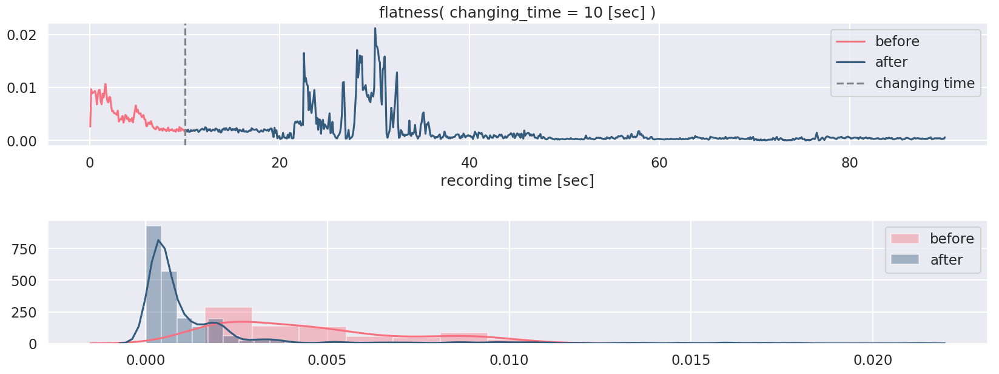

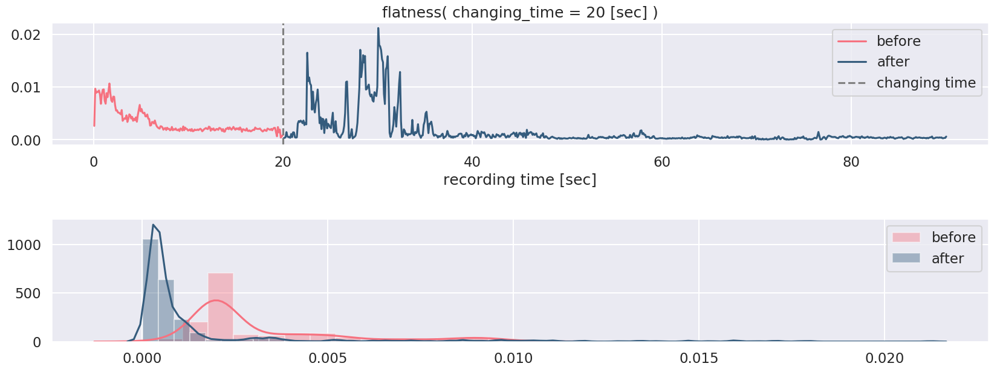

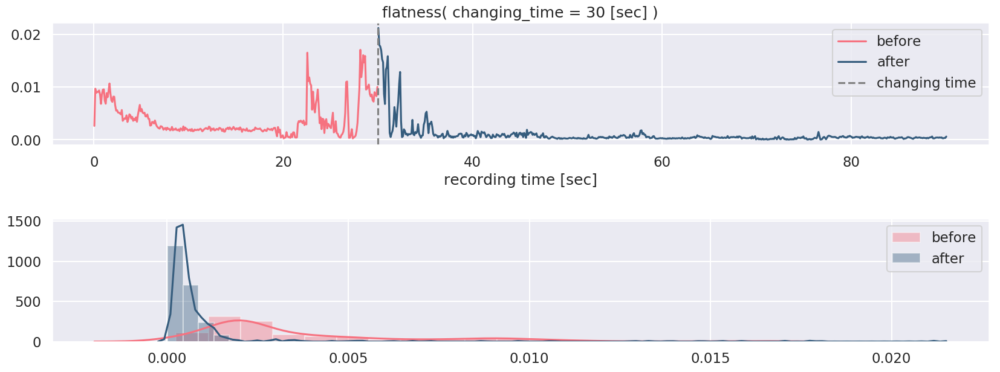

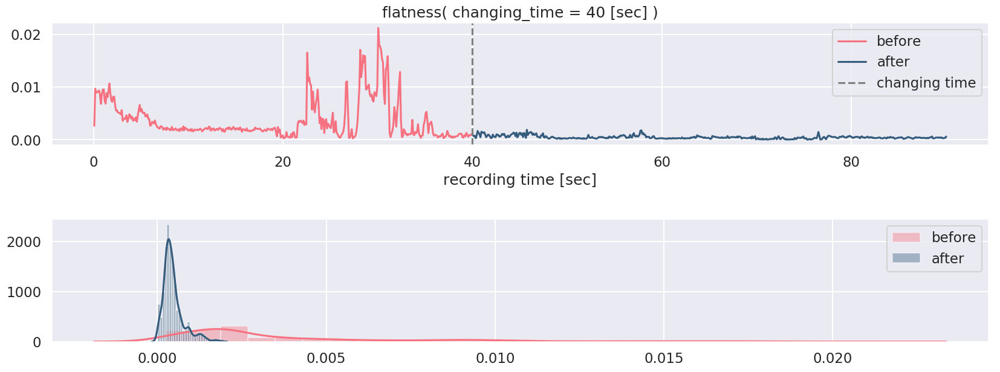

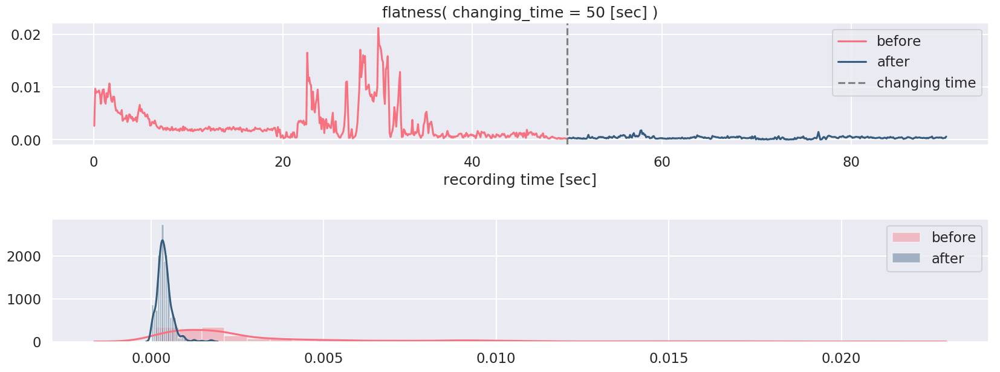

In [14]:
feat = flatness
# feat = zcr
for changing_time_sec in [10, 20, 30, 40, 50]:
    fig, axs = plt.subplots(2, 1, figsize=(20, 7), dpi=100)
    plt.subplots_adjust(wspace=0.8, hspace=0.6)
    axs = axs.ravel()

    changing_idx = changing_time_sec*SR_FEAT
    axs[0].plot(x_feat_sec[:changing_idx], feat[:changing_idx], color=cp[1], label='before')
    axs[0].plot(x_feat_sec[changing_idx:], feat[changing_idx:], color=cp[4], label='after')
    axs[0].axvline(changing_time_sec, color='gray', linestyle='--', label='changing time')
    axs[0].set_title(f'flatness( changing_time = {changing_time_sec} [sec] )')
    axs[0].set_xlabel('recording time [sec]')
    axs[0].legend()
    sns.distplot(feat[:changing_idx], ax=axs[1], color=cp[1], label='before')
    sns.distplot(feat[changing_idx:], ax=axs[1], color=cp[4], label='after')
    axs[1].legend()

> 上図の適切な changing time をモデリングにより求める

# Modeling

## ガンマ分布 centroid

- centroid を ガンマ分布でモデリングする。
- パラメータのalphaとbeta は、非負の連続変数であるので、事前分布には指数分布を用いた。
- gamma の alphaとbetaは、$\mu, \sigma$ と
$$
\alpha = \frac{\mu^2}{\sigma^2}  \\
\beta = \frac{\mu}{\sigma^2}
$$

の関係がある


In [15]:
# 観測データから mu_1, mu_2, sigma_1, sigma_2 の期待値を考える
# ヒストグラムからなんとなく期待値を目測した
obs_mu_1 = 3000
obs_mu_2 = 2000
obs_sigma_1 = 1000
obs_sigma_2 = 500

In [16]:
alpha_1_ = obs_mu_1**2 / obs_sigma_1**2
alpha_2_ = obs_mu_2**2 / obs_sigma_2**2
beta_1_ = obs_mu_1 / obs_sigma_1**2
beta_2_ = obs_mu_2 / obs_sigma_2**2
alpha_1_, alpha_2_, beta_1_, beta_2_

(9.0, 16.0, 0.003, 0.008)

<br>

モデルの作成

In [17]:
with pm.Model() as model:
    # 指数分布 (lambda = 1/E[X])
    alpha_1 = pm.Exponential("alpha_1", lam=1/alpha_1_)  # 指数分布のlambdaは lambda=1/E[X] であることを用いた
    alpha_2 = pm.Exponential("alpha_2", lam=1/alpha_2_)
    beta_1 = pm.Exponential('beta_1', lam=1/beta_1_)
    beta_2 = pm.Exponential('beta_2', lam=1/beta_2_)
    tau_sec = pm.Uniform("tau_sec", lower=0, upper=100)
    
    # mu と sigma に変換
    mu_1 = pm.Deterministic('mu_1', alpha_1/beta_1)
    mu_2 = pm.Deterministic('mu_2', alpha_2/beta_2)
    sigma_1 = pm.Deterministic('sigma_1', np.sqrt(alpha_1/beta_1**2))
    sigma_2 = pm.Deterministic('sigma_2', np.sqrt(alpha_2/beta_2**2))

In [18]:
with model:
    alpha_ = pm.math.switch(x_feat_sec < tau_sec, alpha_1, alpha_2)
    beta_ = pm.math.switch(x_feat_sec < tau_sec, beta_1, beta_2)

<br>

ポアソン分布を定義

In [19]:
with model:
    observation = pm.Gamma("obs", alpha_, beta_, observed=centroid)

In [20]:
model

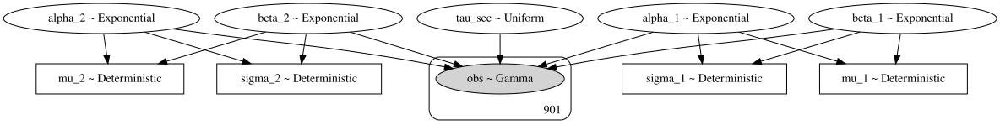

In [21]:
pm.model_to_graphviz(model)

In [69]:
with model:
    map_infs = pm.find_MAP()
map_infs

logp = -6,974.5, ||grad|| = 75.215: 100%|██████████| 19/19 [00:00<00:00, 2052.54it/s]  


{'alpha_1_log__': array(2.30936008),
 'alpha_2_log__': array(3.80829212),
 'beta_1_log__': array(-5.72630413),
 'beta_2_log__': array(-3.74687531),
 'tau_sec_interval__': array(0.),
 'alpha_1': array(10.06797987),
 'alpha_2': array(45.07339297),
 'beta_1': array(0.0032591),
 'beta_2': array(0.02359135),
 'tau_sec': array(50.),
 'mu_1': array(3089.19001207),
 'mu_2': array(1910.59009019),
 'sigma_1': array(973.58405559),
 'sigma_2': array(284.58197896)}

<br>

NUTS でサンプリング

In [23]:
with model:
    step = pm.NUTS()
    trace = pm.sample(500, step=step, chains=4, tune=500, start=map_infs, random_seed=9)

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [tau_sec, beta_2, beta_1, alpha_2, alpha_1]
Sampling 4 chains, 0 divergences: 100%|██████████| 4000/4000 [04:20<00:00, 15.34draws/s]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The acceptance probability does not match the target. It is 0.6512138682491215, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


In [24]:
chain = trace
pm.summary(chain)

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
alpha_1,12.513,0.992,11.027,14.222,0.342,0.250,8.0,8.0,8.0,35.0,1.49
alpha_2,45.346,2.461,40.354,50.361,0.277,0.196,79.0,79.0,78.0,126.0,1.30
beta_1,0.004,0.000,0.003,0.004,0.000,0.000,9.0,9.0,8.0,22.0,1.48
beta_2,0.023,0.001,0.021,0.026,0.000,0.000,78.0,78.0,77.0,125.0,1.39
tau_sec,41.326,0.081,41.167,41.450,0.005,0.003,269.0,269.0,300.0,440.0,1.02
mu_1,3313.854,47.772,3218.577,3397.074,4.098,2.910,136.0,135.0,135.0,300.0,1.02
mu_2,1929.936,12.609,1907.055,1953.914,0.629,0.445,402.0,401.0,403.0,691.0,1.01
sigma_1,939.002,39.758,874.470,1014.660,13.478,9.978,9.0,9.0,9.0,24.0,1.42
sigma_2,286.912,7.932,271.237,303.566,0.888,0.631,80.0,80.0,80.0,129.0,1.35


/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"


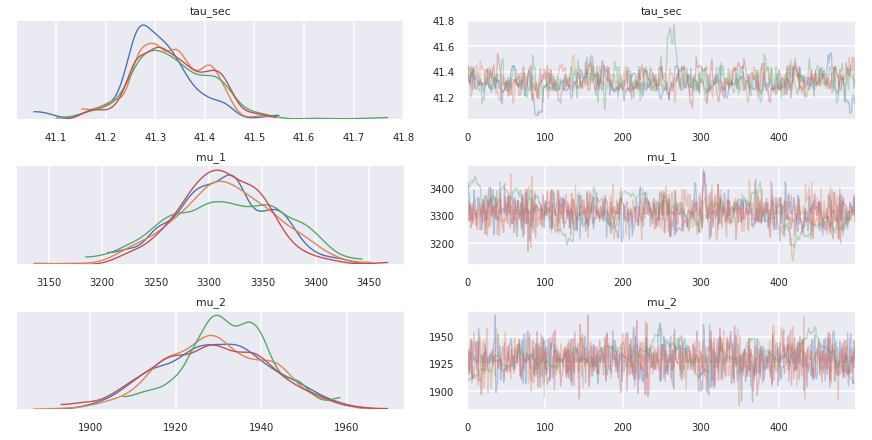

In [70]:
# chain = trace[2000:]
_ = pm.traceplot(chain, ['tau_sec', 'mu_1', 'mu_2'])

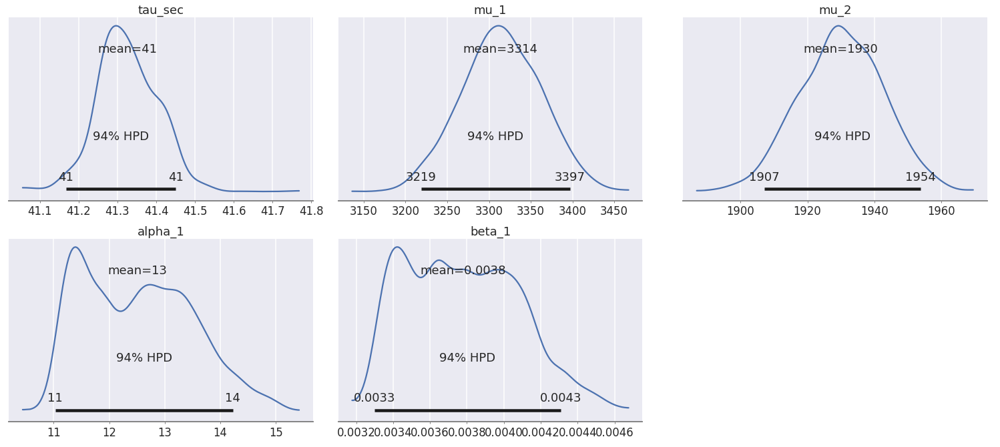

In [91]:
_ = pm.plot_posterior(chain, ['tau_sec', 'mu_1', 'mu_2', 'alpha_1', 'beta_1'])

<br>

結果

In [27]:
tau_sec_post = chain['tau_sec']
x_kde, kde = get_kde(tau_sec_post, expand_rate=0.01)

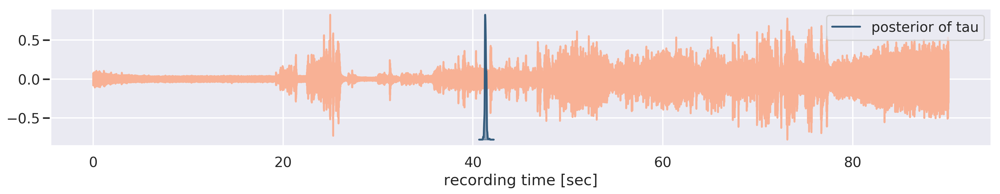

In [162]:
plt.figure(figsize=(20, 3), dpi=200)
plt.plot(x_wav_sec, wav, color=cp[0], label='wav')
plt.xlabel('recording time [sec]')

ax = plt.twinx()
ax.fill_between(x_kde, kde, color=cp[4], alpha=0.5)
ax.plot(x_kde, kde, color=cp[4], label='posterior of tau')
ax.set_yticks([])
plt.legend()

> すごい鋭い...

<br>

alphaとbeta の事後分布を使ってプロット

In [78]:
mean_tau_sec = tau_sec_post.mean()

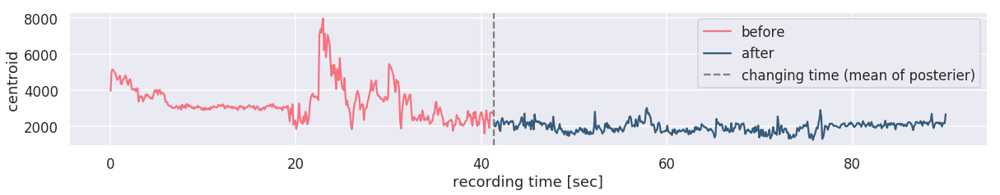

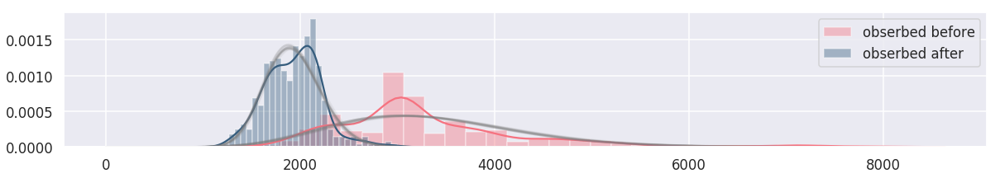

In [161]:
feat = centroid
changing_idx = int(mean_tau_sec*SR_FEAT)
feat_before = feat[:changing_idx] 
feat_after = feat[changing_idx:]
plt.figure(figsize=(20, 3))
plt.plot(x_feat_sec[:changing_idx], feat_before, color=cp[1], label='before')
plt.plot(x_feat_sec[changing_idx:], feat_after, color=cp[4], label='after')
plt.axvline(mean_tau_sec, color='gray', linestyle='--', label='changing time (mean of posterier)')
plt.ylabel('centroid')
plt.xlabel('recording time [sec]')
plt.legend()

plt.figure(figsize=(20, 3))
sns.distplot(feat_before, color=cp[1], label='obserbed before', bins=30)
sns.distplot(feat_after, color=cp[4], label='obserbed after', bins=30)
plt.plot()
plt.legend()

x = np.linspace(0, 8000, 1000)
for idx in range(len(chain[::30])):
    pdf_1 = stats.gamma.pdf(x, chain['alpha_1'][idx], scale=1/chain['beta_1'][idx])
    pdf_2 = stats.gamma.pdf(x, chain['alpha_2'][idx], scale=1/chain['beta_2'][idx])
    plt.plot(x, pdf_1, color='gray', alpha=0.1)
    plt.plot(x, pdf_2, color='gray', alpha=0.1)


## ガンマ分布 flatness

- ZCR を ガンマ分布でモデリングする。
- パラメータのalphaとbeta は、非負の連続変数であるので、事前分布には指数分布を用いた。
- gamma の alphaとbetaは、$\mu, \sigma$ と
$$
\alpha = \frac{\mu^2}{\sigma^2}  \\
\beta = \frac{\mu}{\sigma^2}
$$

の関係がある


In [10]:
# 観測データから mu_1, mu_2, sigma_1, sigma_2 の期待値を考える
# ヒストグラムからなんとなく期待値を目測した
obs_mu_1 = 0.003
obs_mu_2 = 0.002
obs_sigma_1 = 0.005
obs_sigma_2 = 0.001

In [11]:
alpha_1_ = obs_mu_1**2 / obs_sigma_1**2
alpha_2_ = obs_mu_2**2 / obs_sigma_2**2
beta_1_ = obs_mu_1 / obs_sigma_1**2
beta_2_ = obs_mu_2 / obs_sigma_2**2
alpha_1_, alpha_2_, beta_1_, beta_2_

(0.36, 4.0, 120.0, 2000.0000000000002)

<br>

モデルの作成

In [12]:
with pm.Model() as model:
    # 指数分布 (lambda = 1/E[X])
    alpha_1 = pm.Exponential("alpha_1", lam=1/alpha_1_)
    alpha_2 = pm.Exponential("alpha_2", lam=1/alpha_2_)
    beta_1 = pm.Exponential('beta_1', lam=1/beta_1_)
    beta_2 = pm.Exponential('beta_2', lam=1/beta_2_)
    tau_sec = pm.Uniform("tau_sec", lower=0, upper=100)
    
    # mu と sigma に変換
    mu_1 = pm.Deterministic('mu_1', alpha_1/beta_1)
    mu_2 = pm.Deterministic('mu_2', alpha_2/beta_2)
    sigma_1 = pm.Deterministic('sigma_1', np.sqrt(alpha_1/beta_1**2))
    sigma_2 = pm.Deterministic('sigma_2', np.sqrt(alpha_2/beta_2**2))

In [13]:
with model:
    alpha_ = pm.math.switch(x_feat_sec < tau_sec, alpha_1, alpha_2)
    beta_ = pm.math.switch(x_feat_sec < tau_sec, beta_1, beta_2)

<br>

ポアソン分布を定義

In [14]:
with model:
    observation = pm.Gamma("obs", alpha_, beta_, observed=flatness)

In [15]:
with model:
    map_infs = pm.find_MAP()
map_infs

logp = 5,211.8, ||grad|| = 14.879: 100%|██████████| 16/16 [00:00<00:00, 1513.92it/s]  


{'alpha_1_log__': array(0.08639594),
 'alpha_2_log__': array(1.03706952),
 'beta_1_log__': array(5.87041422),
 'beta_2_log__': array(8.88945952),
 'tau_sec_interval__': array(0.),
 'alpha_1': array(1.09023791),
 'alpha_2': array(2.82093818),
 'beta_1': array(354.39574869),
 'beta_2': array(7255.09685483),
 'tau_sec': array(50.),
 'mu_1': array(0.00307633),
 'mu_2': array(0.00038882),
 'sigma_1': array(0.00294627),
 'sigma_2': array(0.0002315)}

<br>

NUTS でサンプリング

In [16]:
with model:
    step = pm.NUTS()
    trace = pm.sample(1000, step=step, chains=4, tune=500, start=map_infs, random_seed=7)

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [tau_sec, beta_2, beta_1, alpha_2, alpha_1]
Sampling 4 chains, 0 divergences: 100%|██████████| 6000/6000 [06:39<00:00, 15.00draws/s]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


In [17]:
chain = trace
pm.summary(chain)

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
alpha_1,1.235,0.083,1.095,1.405,0.021,0.015,16.0,15.0,17.0,84.0,1.18
alpha_2,2.831,0.161,2.548,3.146,0.016,0.011,104.0,104.0,105.0,215.0,1.03
beta_1,380.132,30.915,323.619,441.491,7.369,5.451,18.0,17.0,19.0,43.0,1.16
beta_2,7231.777,453.670,6378.438,8088.807,44.540,31.583,104.0,104.0,104.0,281.0,1.03
tau_sec,46.775,0.132,46.452,46.970,0.011,0.008,146.0,146.0,188.0,197.0,1.02
mu_1,0.003,0.000,0.003,0.004,0.000,0.000,632.0,632.0,629.0,1094.0,1.01
mu_2,0.000,0.000,0.000,0.000,0.000,0.000,881.0,880.0,882.0,1384.0,1.00
sigma_1,0.003,0.000,0.003,0.003,0.000,0.000,33.0,33.0,30.0,95.0,1.10
sigma_2,0.000,0.000,0.000,0.000,0.000,0.000,136.0,136.0,137.0,328.0,1.02


/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"


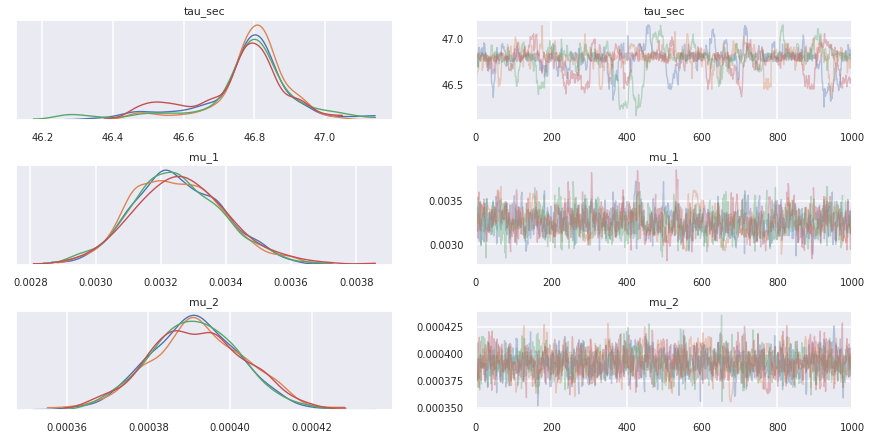

In [18]:
# chain = trace[2000:]
_ = pm.traceplot(chain, ['tau_sec', 'mu_1', 'mu_2'])

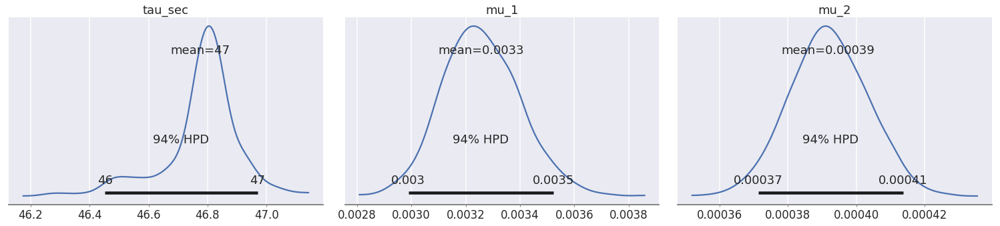

In [19]:
_ = pm.plot_posterior(chain, ['tau_sec', 'mu_1', 'mu_2'])

<br>

結果

In [20]:
tau_sec_post = chain['tau_sec']
x_kde, kde = get_kde(tau_sec_post, expand_rate=0.01)

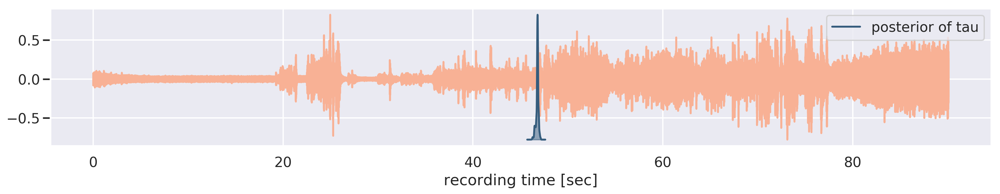

In [21]:
plt.figure(figsize=(20, 3), dpi=200)
plt.plot(x_wav_sec, wav, color=cp[0], label='wav')
plt.xlabel('recording time [sec]')

ax = plt.twinx()
ax.fill_between(x_kde, kde, color=cp[4], alpha=0.5)
ax.plot(x_kde, kde, color=cp[4], label='posterior of tau')
ax.set_yticks([])
plt.legend()

> すごい鋭い...

<br>

alphaとbeta の事後分布を使ってプロット

In [22]:
mean_tau_sec = tau_sec_post.mean()

(-0.001, 0.01)

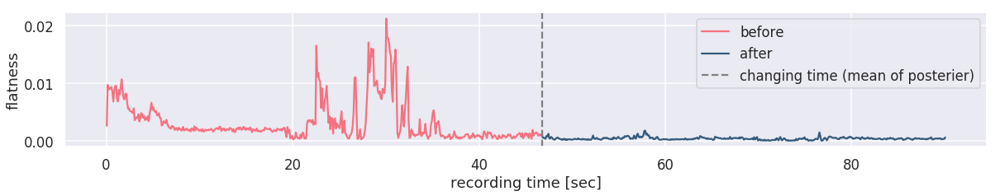

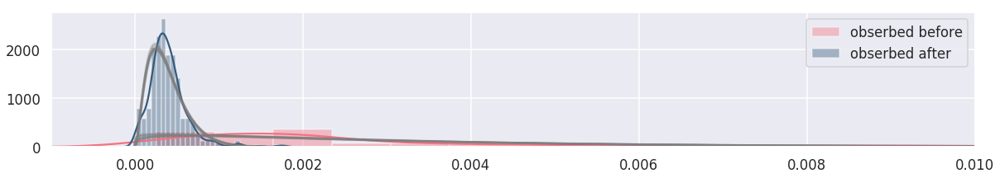

In [25]:
feat = flatness
changing_idx = int(mean_tau_sec*SR_FEAT)
feat_before = feat[:changing_idx] 
feat_after = feat[changing_idx:]
plt.figure(figsize=(20, 3))
plt.plot(x_feat_sec[:changing_idx], feat_before, color=cp[1], label='before')
plt.plot(x_feat_sec[changing_idx:], feat_after, color=cp[4], label='after')
plt.axvline(mean_tau_sec, color='gray', linestyle='--', label='changing time (mean of posterier)')
plt.ylabel('flatness')
plt.xlabel('recording time [sec]')
plt.legend()

plt.figure(figsize=(20, 3))
sns.distplot(feat_before, color=cp[1], label='obserbed before', bins=30)
sns.distplot(feat_after, color=cp[4], label='obserbed after', bins=30)
plt.plot()
plt.legend()

x = np.linspace(-0.001, 0.01, 1000)
for idx in range(len(chain[::30])):
    pdf_1 = stats.gamma.pdf(x, chain['alpha_1'][idx], scale=1/chain['beta_1'][idx])
    pdf_2 = stats.gamma.pdf(x, chain['alpha_2'][idx], scale=1/chain['beta_2'][idx])
    plt.plot(x, pdf_1, color='gray', alpha=0.1)
    plt.plot(x, pdf_2, color='gray', alpha=0.1)
plt.xlim(-0.001, 0.01)

## 階層ベイズモデリング
- centroid と flatness をモデリングする
- 今回ポイントなのは、 <font color='orange'>**tau_sec を共通にすること**</font> である

In [17]:
# 観測データから mu_1, mu_2, sigma_1, sigma_2 の期待値を考える
# ヒストグラムからなんとなく期待値を目測した
centroid_obs_mu_1 = 3000
centroid_obs_mu_2 = 2000
centroid_obs_sigma_1 = 1000
centroid_obs_sigma_2 = 500

flatness_obs_mu_1 = 0.003
flatness_obs_mu_2 = 0.002
flatness_obs_sigma_1 = 0.005
flatness_obs_sigma_2 = 0.001

In [18]:
centroid_alpha_1_ = centroid_obs_mu_1**2 / centroid_obs_sigma_1**2
centroid_alpha_2_ = centroid_obs_mu_2**2 / centroid_obs_sigma_2**2
centroid_beta_1_ = centroid_obs_mu_1 / centroid_obs_sigma_1**2
centroid_beta_2_ = centroid_obs_mu_2 / centroid_obs_sigma_2**2

flatness_alpha_1_ = flatness_obs_mu_1**2 / flatness_obs_sigma_1**2
flatness_alpha_2_ = flatness_obs_mu_2**2 / flatness_obs_sigma_2**2
flatness_beta_1_ = flatness_obs_mu_1 / flatness_obs_sigma_1**2
flatness_beta_2_ = flatness_obs_mu_2 / flatness_obs_sigma_2**2

<br>

モデルの作成

In [19]:
with pm.Model() as model:
    # 指数分布 (lambda = 1/E[X])
    centroid_alpha_1 = pm.Exponential("centroid_alpha_1", lam=1/centroid_alpha_1_)
    centroid_alpha_2 = pm.Exponential("centroid_alpha_2", lam=1/centroid_alpha_2_)
    centroid_beta_1 = pm.Exponential('centroid_beta_1', lam=1/centroid_beta_1_)
    centroid_beta_2 = pm.Exponential('centroid_beta_2', lam=1/centroid_beta_2_)
    flatness_alpha_1 = pm.Exponential("flatness_alpha_1", lam=1/flatness_alpha_1_)
    flatness_alpha_2 = pm.Exponential("flatness_alpha_2", lam=1/flatness_alpha_2_)
    flatness_beta_1 = pm.Exponential('flatness_beta_1', lam=1/flatness_beta_1_)
    flatness_beta_2 = pm.Exponential('flatness_beta_2', lam=1/flatness_beta_2_)
    tau_sec = pm.Uniform("tau_sec", lower=0, upper=100)
    
    # mu と sigma に変換
    centroid_mu_1 = pm.Deterministic('centroid_mu_1', centroid_alpha_1/centroid_beta_1)
    centroid_mu_2 = pm.Deterministic('centroid_mu_2', centroid_alpha_2/centroid_beta_2)
    centroid_sigma_1 = pm.Deterministic('centroid_sigma_1', np.sqrt(centroid_alpha_1/centroid_beta_1**2))
    centroid_sigma_2 = pm.Deterministic('centroid_sigma_2', np.sqrt(centroid_alpha_2/centroid_beta_2**2))
    flatness_mu_1 = pm.Deterministic('flatness_mu_1', flatness_alpha_1/flatness_beta_1)
    flatness_mu_2 = pm.Deterministic('flatness_mu_2', flatness_alpha_2/flatness_beta_2)
    flatness_sigma_1 = pm.Deterministic('flatness_sigma_1', np.sqrt(flatness_alpha_1/flatness_beta_1**2))
    flatness_sigma_2 = pm.Deterministic('flatness_sigma_2', np.sqrt(flatness_alpha_2/flatness_beta_2**2))

In [20]:
with model:
    flatness_alpha_ = pm.math.switch(x_feat_sec < tau_sec, flatness_alpha_1, flatness_alpha_2)
    flatness_beta_ = pm.math.switch(x_feat_sec < tau_sec, flatness_beta_1, flatness_beta_2)
    centroid_alpha_ = pm.math.switch(x_feat_sec < tau_sec, centroid_alpha_1, centroid_alpha_2)
    centroid_beta_ = pm.math.switch(x_feat_sec < tau_sec, centroid_beta_1, centroid_beta_2)

<br>

ポアソン分布を定義

In [21]:
with model:
    flatness_observation = pm.Gamma("flatness_obs", flatness_alpha_, flatness_beta_, observed=flatness)
    centroid_observation = pm.Gamma("centroid_obs", centroid_alpha_, centroid_beta_, observed=centroid)
model

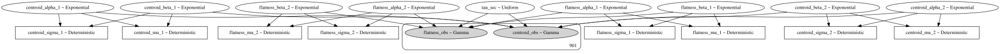

In [24]:
pm.model_to_graphviz(model)

In [99]:
with model:
    map_infs = pm.find_MAP()
map_infs

logp = -1,747.3, ||grad|| = 1.3684: 100%|██████████| 38/38 [00:00<00:00, 1254.25it/s]  


{'centroid_alpha_1_log__': array(2.30926666),
 'centroid_alpha_2_log__': array(3.80822315),
 'centroid_beta_1_log__': array(-5.72640158),
 'centroid_beta_2_log__': array(-3.74694274),
 'flatness_alpha_1_log__': array(0.08621545),
 'flatness_alpha_2_log__': array(1.03706743),
 'flatness_beta_1_log__': array(5.87017684),
 'flatness_beta_2_log__': array(8.88941373),
 'tau_sec_interval__': array(0.),
 'centroid_alpha_1': array(10.06703938),
 'centroid_alpha_2': array(45.07028438),
 'centroid_beta_1': array(0.00325878),
 'centroid_beta_2': array(0.02358976),
 'flatness_alpha_1': array(1.09004116),
 'flatness_alpha_2': array(2.8209323),
 'flatness_beta_1': array(354.31163147),
 'flatness_beta_2': array(7254.76468974),
 'tau_sec': array(50.),
 'centroid_mu_1': array(3089.2024877),
 'centroid_mu_2': array(1910.58716069),
 'centroid_sigma_1': array(973.6334637),
 'centroid_sigma_2': array(284.59135653),
 'flatness_mu_1': array(0.0030765),
 'flatness_mu_2': array(0.00038884),
 'flatness_sigma_1'

<br>

NUTS でサンプリング

In [100]:
with model:
    step = pm.NUTS()
    trace = pm.sample(5000, step=step, chains=4, tune=1000, start=map_infs, cores=6, random_seed=8)

Multiprocess sampling (4 chains in 6 jobs)
NUTS: [tau_sec, flatness_beta_2, flatness_beta_1, flatness_alpha_2, flatness_alpha_1, centroid_beta_2, centroid_beta_1, centroid_alpha_2, centroid_alpha_1]
Sampling 4 chains, 0 divergences: 100%|██████████| 24000/24000 [44:31<00:00,  8.98draws/s]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


In [101]:
chain = trace
pm.summary(chain)

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
centroid_alpha_1,11.557,0.727,10.258,13.016,0.036,0.025,409.0,409.0,404.0,749.0,1.01
centroid_alpha_2,45.919,3.167,40.054,51.947,0.141,0.100,502.0,502.0,500.0,870.0,1.01
centroid_beta_1,0.004,0.000,0.003,0.004,0.000,0.000,405.0,405.0,401.0,672.0,1.01
centroid_beta_2,0.024,0.002,0.021,0.027,0.000,0.000,502.0,502.0,499.0,894.0,1.01
flatness_alpha_1,1.205,0.071,1.072,1.339,0.003,0.002,473.0,473.0,464.0,1068.0,1.02
flatness_alpha_2,2.843,0.182,2.500,3.176,0.010,0.007,352.0,352.0,352.0,927.0,1.01
flatness_beta_1,368.271,26.793,318.389,419.253,1.179,0.834,517.0,517.0,513.0,1239.0,1.01
flatness_beta_2,7190.203,511.555,6226.681,8143.474,27.775,19.657,339.0,339.0,340.0,838.0,1.01
tau_sec,46.416,0.168,46.219,46.848,0.008,0.006,440.0,438.0,595.0,742.0,1.00
centroid_mu_1,3186.281,43.963,3102.745,3268.187,0.358,0.254,15048.0,15007.0,15080.0,12506.0,1.00


/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
/home/user/.local/lib/python3.6/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argu

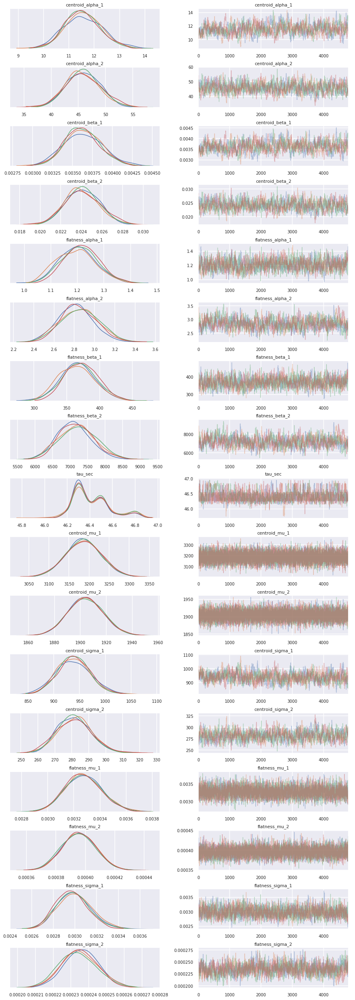

In [102]:
# chain = trace[2000:]
_ = pm.traceplot(chain[200:])

<br>

結果

In [103]:
tau_sec_post = chain['tau_sec']
x_kde, kde = get_kde(tau_sec_post, expand_rate=0.01)

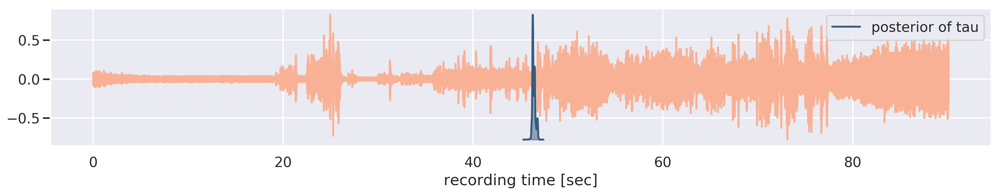

In [104]:
plt.figure(figsize=(20, 3), dpi=200)
plt.plot(x_wav_sec, wav, color=cp[0], label='wav')
plt.xlabel('recording time [sec]')

ax = plt.twinx()
ax.fill_between(x_kde, kde, color=cp[4], alpha=0.5)
ax.plot(x_kde, kde, color=cp[4], label='posterior of tau')
ax.set_yticks([])
plt.legend()

<br>

alphaとbeta の事後分布を使ってプロット

In [105]:
mean_tau_sec = tau_sec_post.mean()

/usr/local/lib/python3.6/dist-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


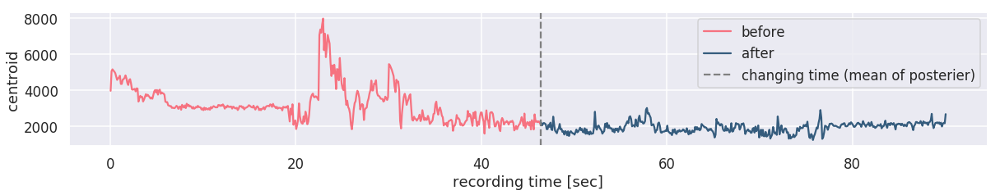

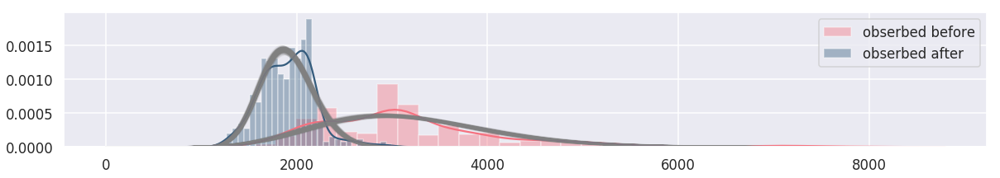

In [106]:
feat = centroid
changing_idx = int(mean_tau_sec*SR_FEAT)
feat_before = feat[:changing_idx] 
feat_after = feat[changing_idx:]
plt.figure(figsize=(20, 3))
plt.plot(x_feat_sec[:changing_idx], feat_before, color=cp[1], label='before')
plt.plot(x_feat_sec[changing_idx:], feat_after, color=cp[4], label='after')
plt.axvline(mean_tau_sec, color='gray', linestyle='--', label='changing time (mean of posterier)')
plt.ylabel('centroid')
plt.xlabel('recording time [sec]')
plt.legend()

plt.figure(figsize=(20, 3))
sns.distplot(feat_before, color=cp[1], label='obserbed before', bins=30)
sns.distplot(feat_after, color=cp[4], label='obserbed after', bins=30)
plt.plot()
plt.legend()

x = np.linspace(0, 8000, 1000)
for idx in range(len(chain[::30])):
    pdf_1 = stats.gamma.pdf(x, chain['centroid_alpha_1'][idx], scale=1/chain['centroid_beta_1'][idx])
    pdf_2 = stats.gamma.pdf(x, chain['centroid_alpha_2'][idx], scale=1/chain['centroid_beta_2'][idx])
    plt.plot(x, pdf_1, color='gray', alpha=0.1)
    plt.plot(x, pdf_2, color='gray', alpha=0.1)

(-0.001, 0.01)

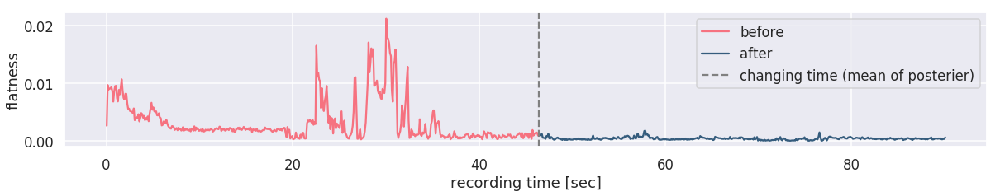

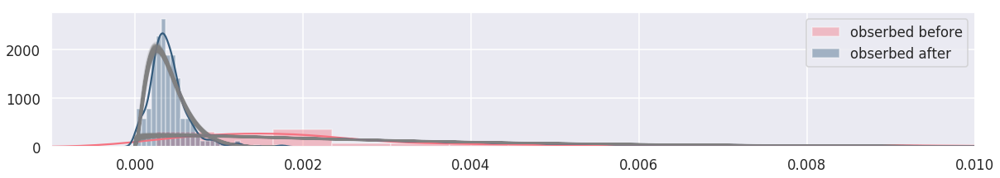

In [107]:
feat = flatness
changing_idx = int(mean_tau_sec*SR_FEAT)
feat_before = feat[:changing_idx] 
feat_after = feat[changing_idx:]
plt.figure(figsize=(20, 3))
plt.plot(x_feat_sec[:changing_idx], feat_before, color=cp[1], label='before')
plt.plot(x_feat_sec[changing_idx:], feat_after, color=cp[4], label='after')
plt.axvline(mean_tau_sec, color='gray', linestyle='--', label='changing time (mean of posterier)')
plt.ylabel('flatness')
plt.xlabel('recording time [sec]')
plt.legend()

plt.figure(figsize=(20, 3))
sns.distplot(feat_before, color=cp[1], label='obserbed before', bins=30)
sns.distplot(feat_after, color=cp[4], label='obserbed after', bins=30)
plt.plot()
plt.legend()

x = np.linspace(-0.001, 0.01, 1000)
for idx in range(len(chain[::30])):
    pdf_1 = stats.gamma.pdf(x, chain['flatness_alpha_1'][idx], scale=1/chain['flatness_beta_1'][idx])
    pdf_2 = stats.gamma.pdf(x, chain['flatness_alpha_2'][idx], scale=1/chain['flatness_beta_2'][idx])
    plt.plot(x, pdf_1, color='gray', alpha=0.1)
    plt.plot(x, pdf_2, color='gray', alpha=0.1)
plt.xlim(-0.001, 0.01)